## Face detection using Haar Cascades

In [1]:
import pymilvus 
from vector_store import Milvus
a = Milvus(collection_name="test")
output_fields = ["vector"]
res = a.col.query(expr="pk>0", output_fields=output_fields)
res

ValidationError: 2 validation errors for Settings
MILVUS_HOST
  Field required [type=missing, input_value={}, input_type=dict]
    For further information visit https://errors.pydantic.dev/2.5/v/missing
MILVUS_PORT
  Field required [type=missing, input_value={}, input_type=dict]
    For further information visit https://errors.pydantic.dev/2.5/v/missing

In [1]:
from pymilvus import connections
connections.connect("default")

In [ ]:
from pymilvus import 

In [ ]:
from services.embedding_service import EmbeddingVoiceService
manifest_file = "/home/long/NeMo/output/speaker_1.json"
a = EmbeddingVoiceService()
embeds = a.embeddings_from_manifest(manifest_file)
type(a.model.test_dataloader())

In [6]:
a = [0,2,3,4,5,7]


range(0, 10)

: 

In [34]:
import os
from omegaconf import OmegaConf
MODEL_CONFIG = "/home/long/face-service/src/temporary_store/diar_infer_telephonic.yaml"
config = OmegaConf.load(MODEL_CONFIG)
type(config)

omegaconf.dictconfig.DictConfig

In [ ]:
from services.embedding_voice_service import EmbeddingVoiceService
from omegaconf import OmegaConf
config = OmegaConf.load("/home/long/face-service/src/temporary_store/diar_infer_telephonic.yaml")
service = EmbeddingVoiceService(cfg=config)
embeddings = service.embeddings_from_manifest("/home/long/NeMo/output/speaker_1.json")
metadata = [{"name":"Mai"}]
voice_emb = service.embed_voice("/home/long/face-service/voice_db/TPM.wav")

In [26]:
from services.embedding_service import sound_similarity
sound_similarity(embeddings, voice_emb)

[tensor([0.1392]), tensor([0.1559])]

In [ ]:
'''
Haar Cascade Face detection with OpenCV  
    Based on tutorial by pythonprogramming.net
    Visit original post: https://pythonprogramming.net/haar-cascade-face-eye-detection-python-opencv-tutorial/  
Adapted by Marcelo Rovai - MJRoBot.org @ 7Feb2018 
'''

import numpy as np
import cv2

# multiple cascades: https://github.com/Itseez/opencv/tree/master/data/haarcascades
faceCascade = cv2.CascadeClassifier('../haarcascade_frontalface_default.xml')

cap = cv2.VideoCapture('../tests/data/y2mate.com - Đa Cấp 40  Cuối Tuần Mất Ngủ_1080p.mp4')
cap.set(3,640) # set Width
cap.set(4,480) # set Height
count= 0
skip_frames = 5
while cap.isOpened():
    ret, img = cap.read()
    # img = cv2.flip(img, -1)
    if count % skip_frames == 0:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = faceCascade.detectMultiScale(
            gray,
            scaleFactor=1.2,
            minNeighbors=5,     
            minSize=(20, 20)
        )

        for (x,y,w,h) in faces:
            cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
            roi_gray = gray[y:y+h, x:x+w]
            roi_color = img[y:y+h, x:x+w]
            

        cv2.imshow('video',img)

        # img = resize_image(frame, 480*854)
        # queue.put({'id':count, 'img':img})
    count += 1
    k = cv2.waitKey(30) & 0xff
    if k == 27 or not ret: # press 'ESC' to quit
        cap.release()
        break

cap.release()
cv2.destroyAllWindows()

In [1]:
import cv2
from queue import Queue
import math
from utils import resize_image


cap = cv2.VideoCapture('../tests/data/y2mate.com - Đa Cấp 40  Cuối Tuần Mất Ngủ_1080p.mp4')
fps = cap.get(cv2.CAP_PROP_FPS)
desired_fps = 1
skip_frames = round(fps / desired_fps)
frames = cap.get(cv2.CAP_PROP_FRAME_COUNT) 
desired_frames = math.ceil(frames / fps * desired_fps)

print("Desire frames: ", desired_frames)
# result = Queue(maxsize=desired_frames)

def extract_frames(queue: Queue, cap: cv2.VideoCapture, skip_frames: int):
    count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if ret:
            if count % skip_frames == 0:
                img = resize_image(frame, 480*854)
                queue.put({'id':count, 'img':img})
            count += 1
        else:
            cap.release()
            break
    print("Actual frames: ", queue.qsize())

Desire frames:  877
Actual frames:  877


In [7]:
result.get().shape

(720, 1280, 3)

## Face detection using dlib (HOG and CNN)
https://pyimagesearch.com/2021/04/19/face-detection-with-dlib-hog-and-cnn/


https://viblo.asia/p/facial-recognition-system-face-alignment-eW65G2BalDO

https://github.com/PyImageSearch/imutils/blob/master/imutils/face_utils/facealigner.py

In [ ]:
from imutils import face_utils
from imutils.face_utils import FaceAligner
import imutils
import time
import dlib
import os

detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor("model/shape_predictor_68_face_landmarks.dat")
fa = FaceAligner(predictor, desiredFaceWidth=256)

frame = 
frame = imutils.resize(frame, width=600)
height, width = frame.shape[:2]
gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    # detect faces in the grayayscale frame
rects = detector(gray_frame, 0)


# if the `s` key was pressed save the first found face
if key == ord('s'):
    if len(rects) > 0:
        faceAligned = fa.align(frame, gray_frame, rects[0])
        image_name = base_dir + str(count_image) + ".png"
        # save image
        cv2.imwrite(image_name, faceAligned)
        # show image
        cv2.imshow(image_name, faceAligned)
        count_image += 1
        if count_image > 10:
            count_image = 0

    # loopop over the face detections
    for rect in rects:
        (x,y,w,h) = face_utils.rect_to_bb(rect)
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0,0,255), 1)

    # show the frame
    cv2.imshow("Frame", frame)

# do a bit of cleanup
cv2.destroyAllWindows()
vs.stop()


In [11]:
from detector import HaarCascadesDetector
import skimage.io as skio
det = HaarCascadesDetector()
from services.extract_video_service import ExtractVideoService

input_path = "/home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg"
# input_path = "/home/hung/PycharmProjects/FaceService/tests/data/1684212280-476-local.jpg"

service = ExtractVideoService()
file_paths = [input_path]*10000
result = []

for file_path in file_paths:
    result.append(service._frame_face_recog(file_path))




==> Start Extracting faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg...
==> Done Extracting faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg | Time: 0.15546441078186035
==> Start Searching faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg...
==> Done Searching faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg | Time: 0.002972841262817383
Result /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg:  [{'score': 0.3137097954750061, 'id': 'jvevermind'}]
==> Start Extracting faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg...
==> Done Extracting faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg | Time: 0.1450486183166504
==> Start Searching faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji

In [9]:
from multiprocessing.pool import ThreadPool

with ThreadPool(4) as pool:
    result2 = pool.map(service._frame_face_recog, file_paths)

==> Start Extracting faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg...==> Start Extracting faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg...
==> Start Extracting faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg...
==> Start Extracting faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg...

==> Done Extracting faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg | Time: 0.32708120346069336
==> Start Searching faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg...
==> Done Searching faces for image /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg | Time: 0.002107381820678711
Result /home/hung/PycharmProjects/FaceService/images/5f5tRfrdjwxhLce76sFJji/7.jpg:  [{'score': 0.3137097954750061, 'id': 'jvevermind'}]
==> Start Ex

In [10]:
for i in range(len(result2)):
    if len(result2[i]['7']) != 1:
        print(result2[i]['7'], i)

[] 1
[] 1140
[] 1592
[] 2623
[] 3443
[] 3816


In [13]:
for i in range(len(result)):
    if len(result[i]['7']) != 1:
        print(result[i]['7'], i)

In [7]:
import requests
import numpy as np
from multiprocessing.pool import ThreadPool


def get_embed(result):
    response = requests.post("http://localhost:3000" + "/embed_face", json=result.tolist())
    l = response.json()
    l = np.array(l)
    return l

with ThreadPool(4) as pool:
    results = pool.map(get_embed, [result]*1000)


In [37]:
def compare(A,B):
    return (np.dot(A,B.T)/(np.linalg.norm(A)*np.linalg.norm(B)))[0][0]

identical = True
epsilon = 0.00000001
for i in range(len(results)):
    c = compare(results[0], results[i])
    if c < 1 - epsilon or c > 1 + epsilon:
        print(i,c)
        identical = False

In [33]:
compare(results[0], results[0])[0][0]

1.0

In [16]:
results[2]

array([[ 9.63576138e-02,  8.77442863e-03, -2.95692272e-02,
        -6.84256032e-02,  3.07847187e-02,  5.58292158e-02,
        -2.18623523e-02,  4.47654128e-02, -2.41135713e-03,
         1.19129950e-02, -6.88128406e-04,  2.36968752e-02,
         1.06972745e-02,  5.03081270e-02, -9.85310599e-02,
         6.11051098e-02,  2.94405483e-02, -1.88258924e-02,
        -4.19355258e-02,  6.26408830e-02, -2.08040029e-02,
         1.51106715e-02,  4.97079045e-02, -9.42412112e-03,
        -1.50369527e-02, -5.55079803e-02,  3.54215838e-02,
        -6.29851082e-03, -1.56037183e-02,  4.11963835e-02,
        -4.68920730e-03, -2.31074374e-02, -7.36689866e-02,
        -2.23978963e-02, -5.64050861e-02, -1.62067879e-02,
         6.81600571e-02,  1.18156094e-02, -2.03602407e-02,
         8.63798931e-02,  2.23867036e-02,  2.80491635e-03,
        -5.62221231e-03,  2.69599189e-03, -7.16008693e-02,
        -7.35872686e-02, -1.69612467e-02, -9.91355069e-03,
         3.00059374e-02,  4.83086566e-03, -1.01383142e-0

In [12]:
identical

False

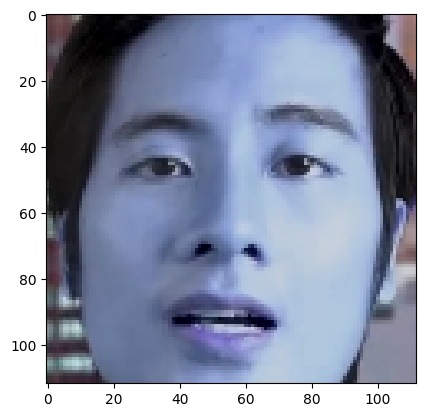

In [2]:
from matplotlib import pyplot as plt

for img in result:
    plt.imshow(img)
    plt.show()

In [8]:
import os
from pathlib import Path
dir_path = Path('../images/')
len([name for name in os.listdir(dir_path) if os.path.isfile(dir_path / name)])

877

In [2]:
from pymilvus import Collection, connections

connections.connect(
    alias="default",
    host="localhost",
    port="19530",
)

collection = Collection("face_db", using="default")
print(collection.schema)

{'auto_id': True, 'description': '', 'fields': [{'name': 'id', 'description': '', 'type': <DataType.VARCHAR: 21>, 'params': {'max_length': 65535}}, {'name': 'pk', 'description': '', 'type': <DataType.INT64: 5>, 'is_primary': True, 'auto_id': True}, {'name': 'vector', 'description': '', 'type': <DataType.FLOAT_VECTOR: 101>, 'params': {'dim': 512}}]}
